# **Importing the Libraries**

In [1]:
import cv2
import numpy as np
import time
import os
import zipfile
import time
from tkinter import filedialog
from google.colab.patches import cv2_imshow
from google.colab import files

import json, random

**upload folder of images - choose all the images (that localized in the same folder) that you want to manipulate**


In [7]:
!apt-get install -y xvfb x11-utils
!pip install pyvirtualdisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()

import os
os.environ['DISPLAY'] = ':0'

from google.colab import files

# Upload multiple files
uploaded = files.upload()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
x11-utils is already the newest version (7.7+5build2).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.


Saving may1004.jpg to may1004.jpg


# **Cartooning the image**

# **Edge Masking**

In [8]:
def edge_mask(img, line_size, blur_value):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gray_blur = cv2.medianBlur(gray, blur_value)
  edges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
  return edges

# **REDUCING COLOUR PALETTE**

**Colour Quantization**

In [9]:
def color_quantization(img, k):
# Transform the image
  data = np.float32(img).reshape((-1, 3))

# Determine criteria
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 0.001)

# Implementing K-Means
  ret, label, center = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  center = np.uint8(center)
  result = center[label.flatten()]
  result = result.reshape(img.shape)
  return result

# **Manipulations**

# **1. Manipulation with these parameters:**

### blur value = 5
### total color = 9 - original value of color quantization
### image blurring
### combining edge mask with the colored image


In [5]:
folder_path = "C:\\Users\\mayab\\Downloads1"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image1(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 5
    edges = edge_mask(img, line_size, blur_value)

    total_color = 9
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path


In [6]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image1(filename))

# Zip the processed images
zip_filename = "1_blur value(5).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

Output hidden; open in https://colab.research.google.com to view.

# **2. Manipulation with these parameters:**
### blur value = 7 - original value of edge mask
### total color = 8
### image blurring
### combining edge mask with the colored image

In [10]:
folder_path = "C:\\Users\\mayab\\Downloads2"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image2(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    total_color = 8
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


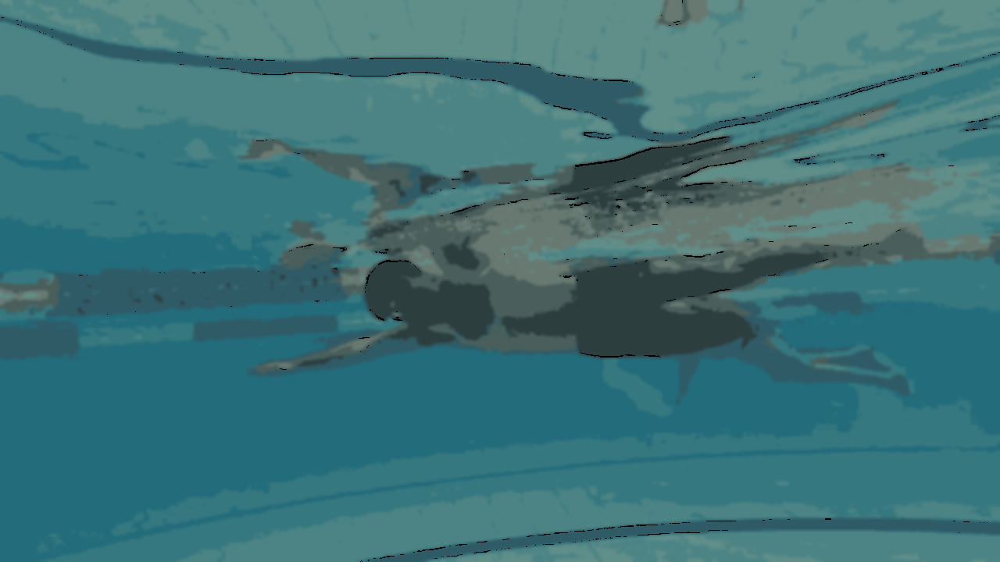

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [11]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image2(filename))

# Zip the processed images
zip_filename = "2_total color(8).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **3. Manipulation with these parameters:**
### blur value = 5
### total color = 8
### blur the picture
### combining edge mask with the colored image

In [12]:

def process_image3(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 5
    edges = edge_mask(img, line_size, blur_value)

    total_color = 8
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


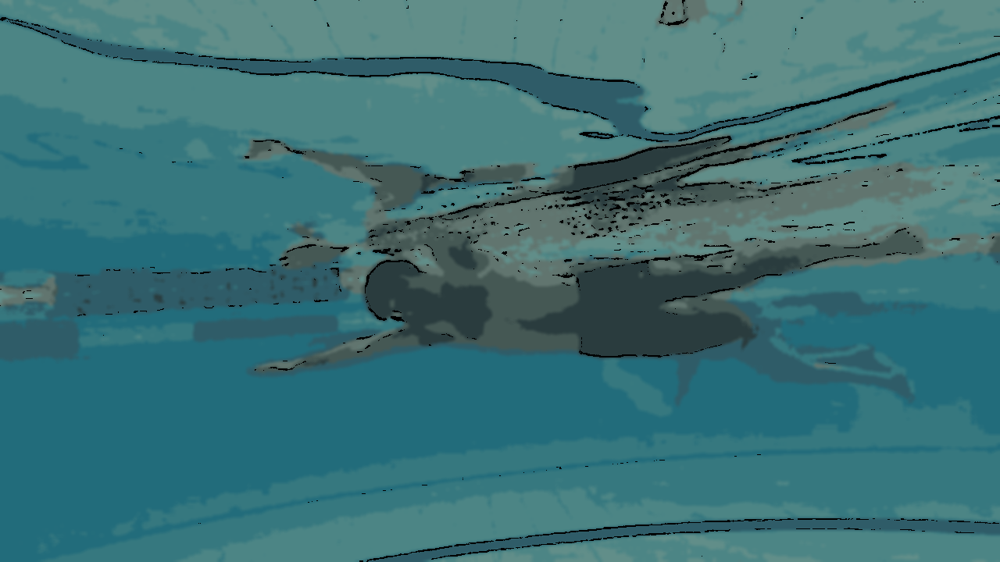

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
import zipfile
folder_path = "C:\\Users\\mayab\\Downloads3"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image3(filename))

# Zip the processed images
zip_filename = "3_blur value(5)+total color(8).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **4. Manipulation with these parameters:**
### blur value = 7 - original value of edge mask
### total color = 10
### image blurring
### combining edge mask with the colored image

In [14]:
folder_path = "C:\\Users\\mayab\\Downloads4"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image4(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    total_color = 10
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


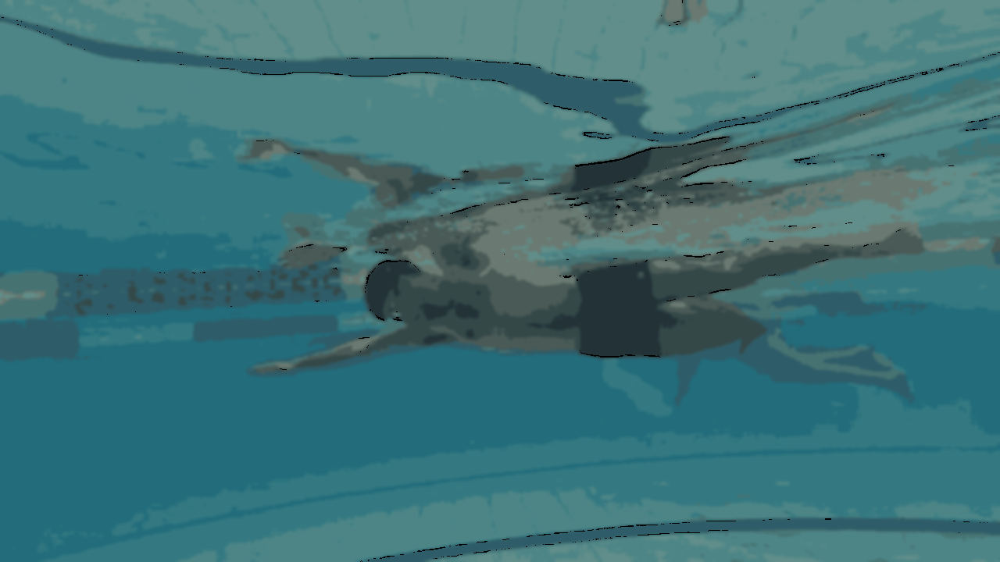

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
import zipfile
import os
import time

# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image4(filename))

# Zip the processed images
zip_filename = "4_total color(10).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **5. Manipulation with these parameters:**
### blur value = 7 - original value of edge mask
### total color = 15
### image blurring
### combining edge mask with the colored image

In [16]:
folder_path = "C:\\Users\\mayab\\Downloads5"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image5(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    total_color = 15
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


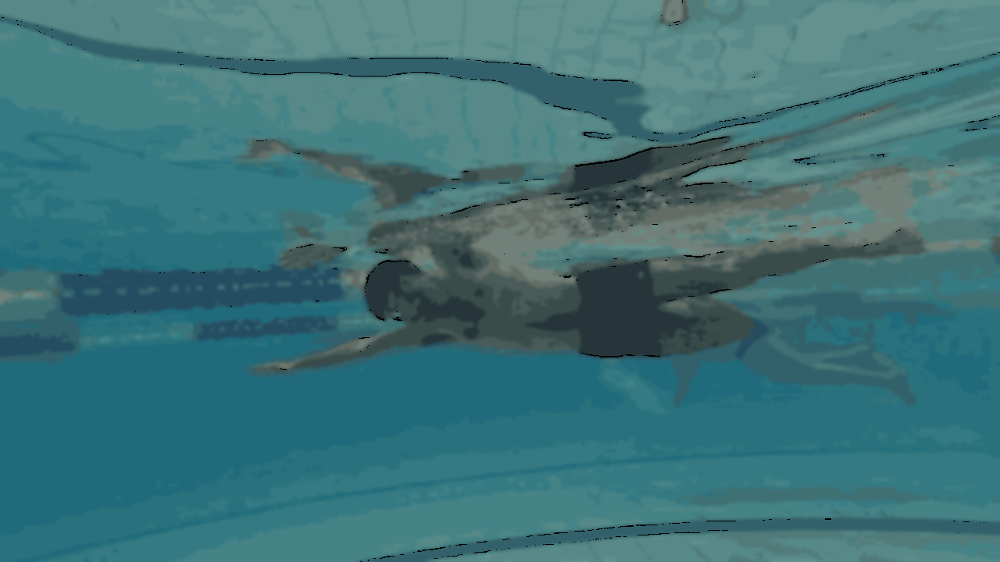

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [17]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image5(filename))

# Zip the processed images
zip_filename = "5_total color(15).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **6. Manipulation with these parameters:**
### blur value = 7 - original value of edge mask (only edge mask)
### combining edge mask with the colored image

In [18]:
folder_path = "C:\\Users\\mayab\\Downloads6"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image6(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


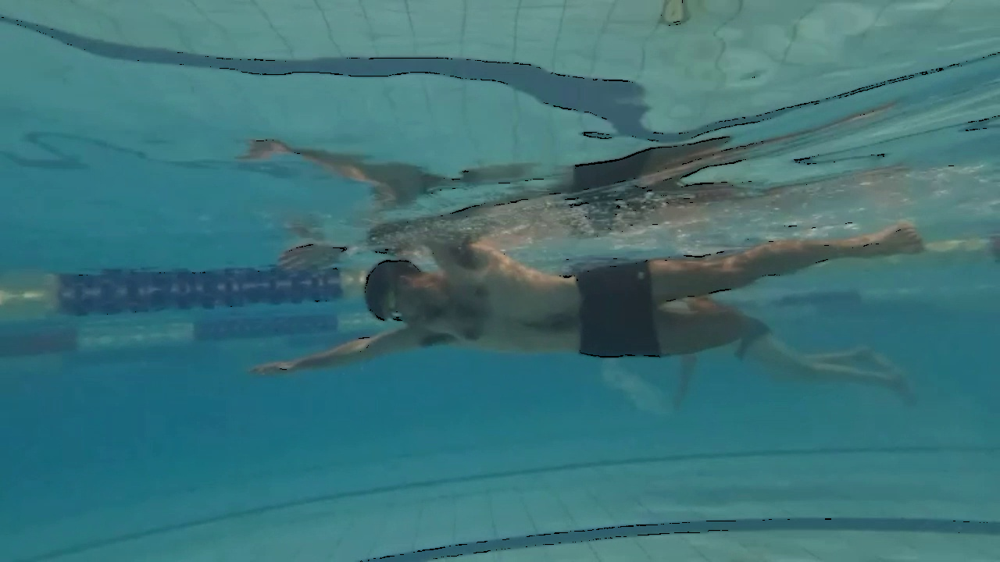

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image6(filename))

# Zip the processed images
zip_filename = "6_edges only effortless1.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **7. Manipulation with these parameters:**
### blur value = 7 - original value of edge mask
### total color = 9 - original value of color quantization
### combining edge mask with the colored image

In [20]:
folder_path = "C:\\Users\\mayab\\Downloads7"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image7(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    total_color = 9
    img = color_quantization(img, total_color)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


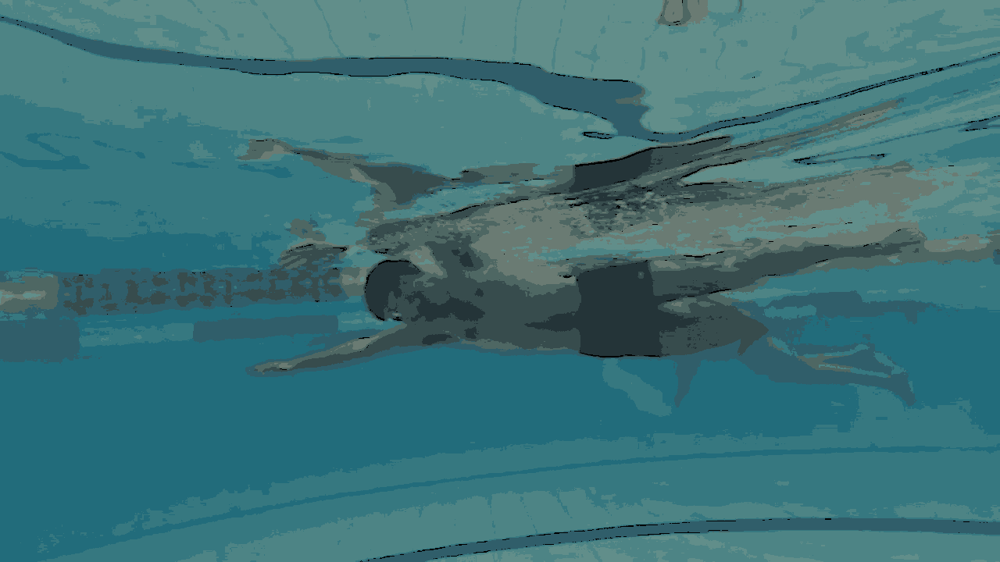

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image7(filename))

# Zip the processed images
zip_filename = "7_without blur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **8. Manipulation with these parameters:**
### blur value = 3
### total color = 9 - original value of color quantization
### image blurring
### combining edge mask with the colored image

In [22]:
folder_path = "C:\\Users\\mayab\\Downloads8"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image8(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 3
    edges = edge_mask(img, line_size, blur_value)

    total_color = 9
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


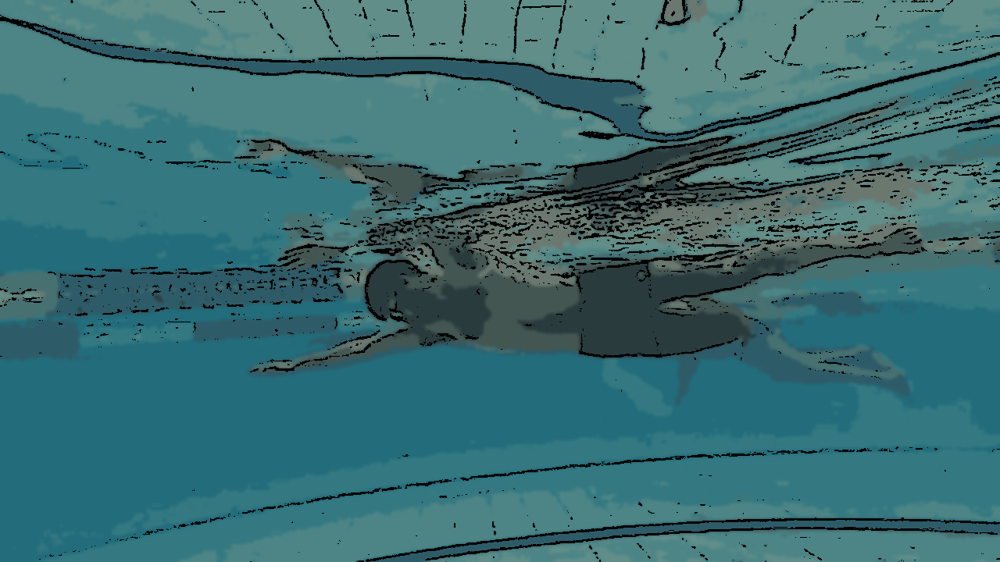

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [23]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image8(filename))

# Zip the processed images
zip_filename = "8_blur value(3).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **9. Manipulation with these parameters:**
### total color = 9 - original value of color quantization
### image blurring
### combining edge mask with the colored image

In [24]:
folder_path = "C:\\Users\\mayab\\Downloads9"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image9(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    total_color = 9
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)

    # Display the results
    cv2_imshow(blurred)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, blurred)

    return save_path

Processing file: may1004.jpg


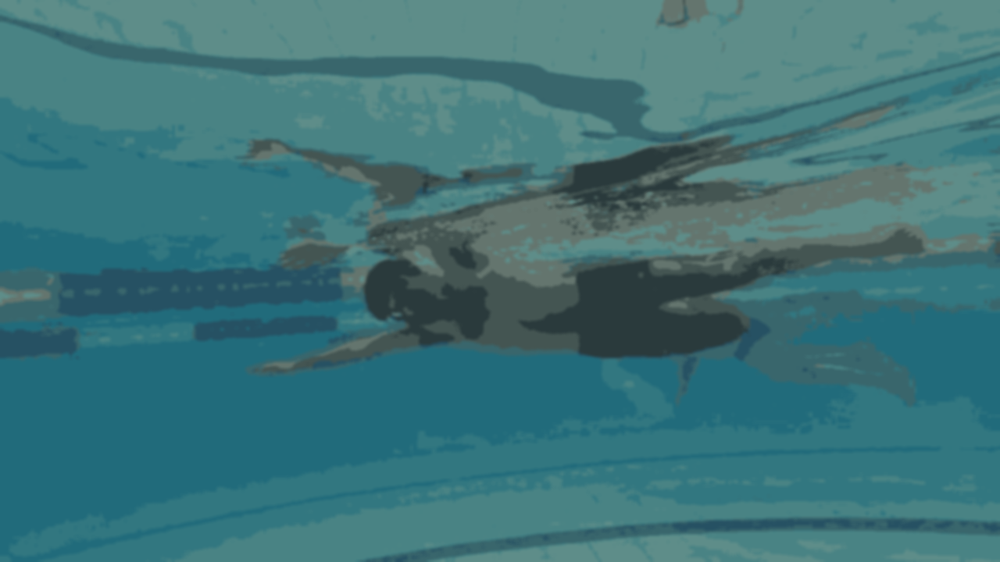

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [25]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image9(filename))

# Zip the processed images
zip_filename = "9_without edges.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **10. Manipulation with these parameters:**
### blur value = 7 - original value of wdge mask
### total color = 15
### total color = 10
### image blurring
### combining edge mask with the colored image

In [26]:
folder_path = "C:\\Users\\mayab\\Downloads10"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image10(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    total_color = 15
    img = color_quantization(img, total_color)
    total_color = 10
    img = color_quantization(img, total_color)

    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, blurred)

    return save_path

Processing file: may1004.jpg


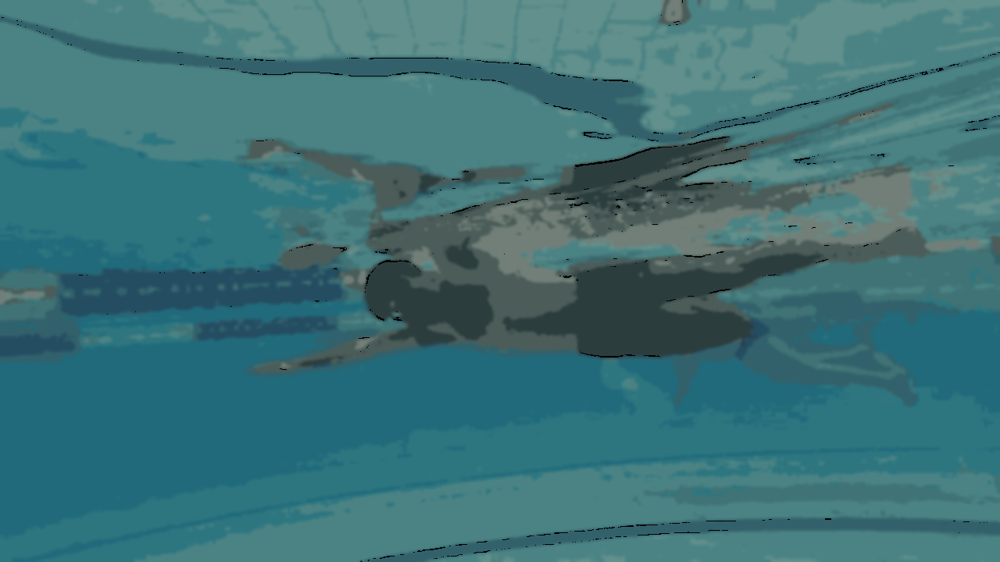

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image10(filename))

# Zip the processed images
zip_filename = "10_total color(15)+total color(10).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **11. Manipulation with these parameters:**
### blur value = 1
### combining edge mask with the colored image

In [28]:
folder_path = "C:\\Users\\mayab\\Downloads11"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image11(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 1
    edges = edge_mask(img, line_size, blur_value)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    # # save_path = os.path.join(folder_path, f"image_{filename.split('.')[0]}.png")
    # cv2.imwrite(f"11_blur value(1) only_{filename.split('.')[0]}.png", cartoon)

    # # Download the image
    # files.download(f"11_blur value(1) only_{filename.split('.')[0]}.png")

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)
    #cv2.imwrite(f"2_total color(8)_{filename.split('.')[0]}.png", cartoon)

    # Download the image
    # files.download(f"2_total color(8)_{filename.split('.')[0]}.png")
    return save_path

Processing file: may1004.jpg


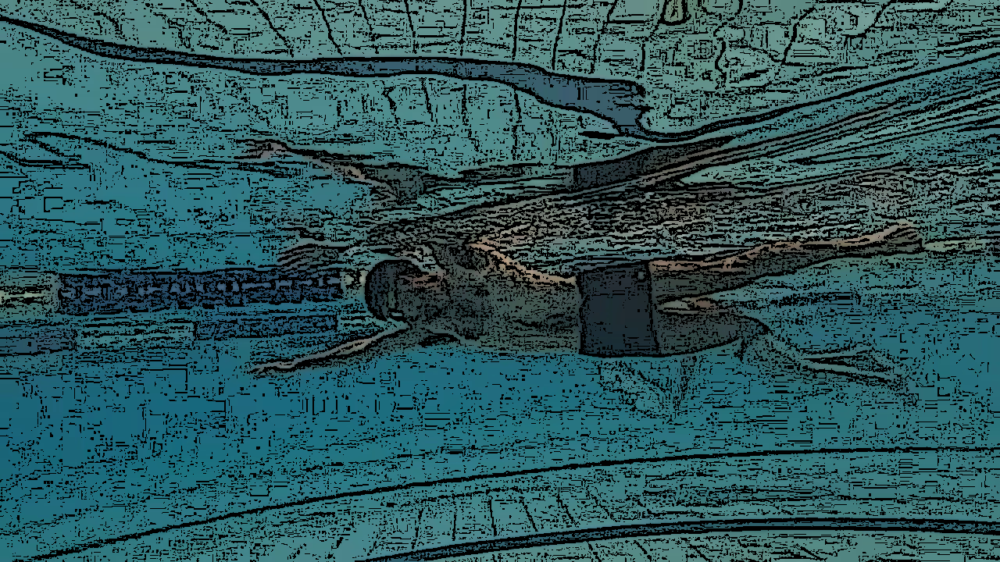

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image11(filename))

# Zip the processed images
zip_filename = "11_blur value(1) only.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **12. Manipulation with these parameters:**
### blur value = 3
### combining edge mask with the colored image

In [30]:
folder_path = "C:\\Users\\mayab\\Downloads12"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image12(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 3
    edges = edge_mask(img, line_size, blur_value)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


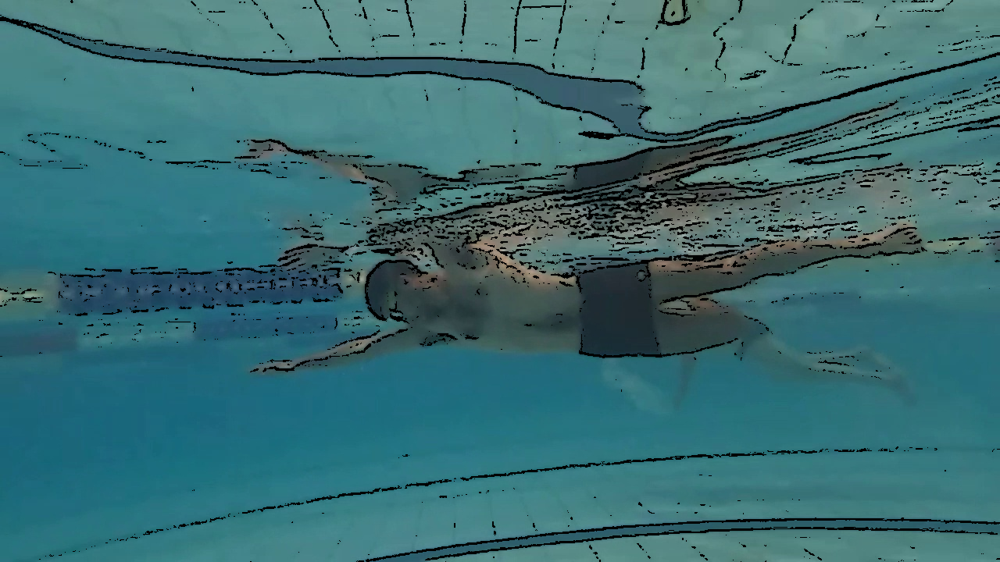

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image12(filename))

# Zip the processed images
zip_filename = "12_blur value(3) only.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **13. Manipulation with these parameters:**
### total color = 9

In [32]:
folder_path = "C:\\Users\\mayab\\Downloads13"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image13(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    total_color = 9
    img = color_quantization(img, total_color)

    # Display the results
    cv2_imshow(img)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, img)

    return save_path

Processing file: may1004.jpg


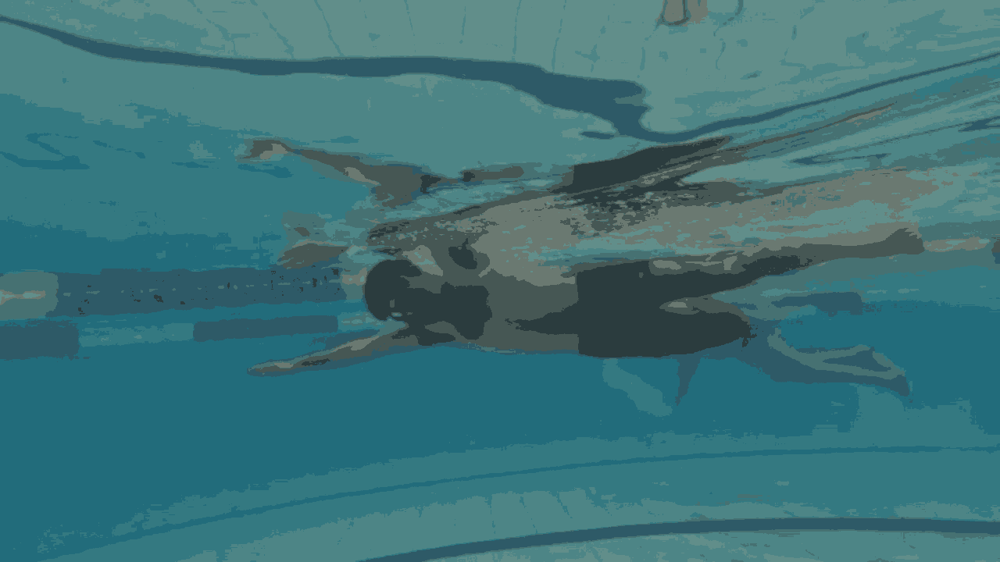

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [33]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image13(filename))

# Zip the processed images
zip_filename = "13_total color(9) only.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **14. Manipulation with these parameters:**
### total color = 7

In [34]:
folder_path = "C:\\Users\\mayab\\Downloads14"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image14(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    total_color = 7
    img = color_quantization(img, total_color)

    # Display the results
    cv2_imshow(img)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, img)

    return save_path

Processing file: may1004.jpg


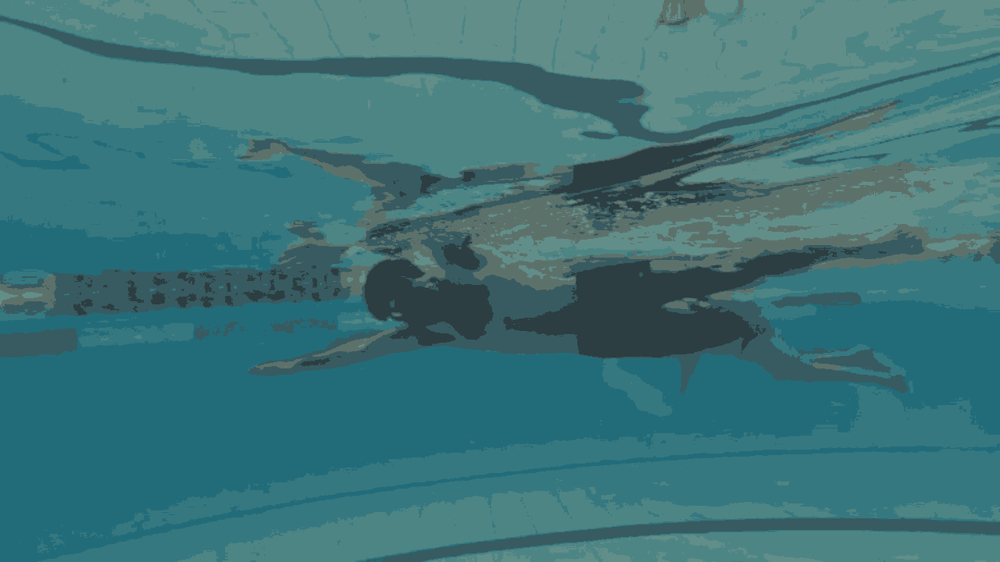

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [35]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image14(filename))

# Zip the processed images
zip_filename = "14_total color(7) only.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **15. Manipulation with these parameters:**
### blur value = 1
### total color = 9
### combining edge mask with the colored image

In [36]:
folder_path = "C:\\Users\\mayab\\Downloads15"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image15(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 1
    edges = edge_mask(img, line_size, blur_value)

    total_color = 9
    img = color_quantization(img, total_color)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


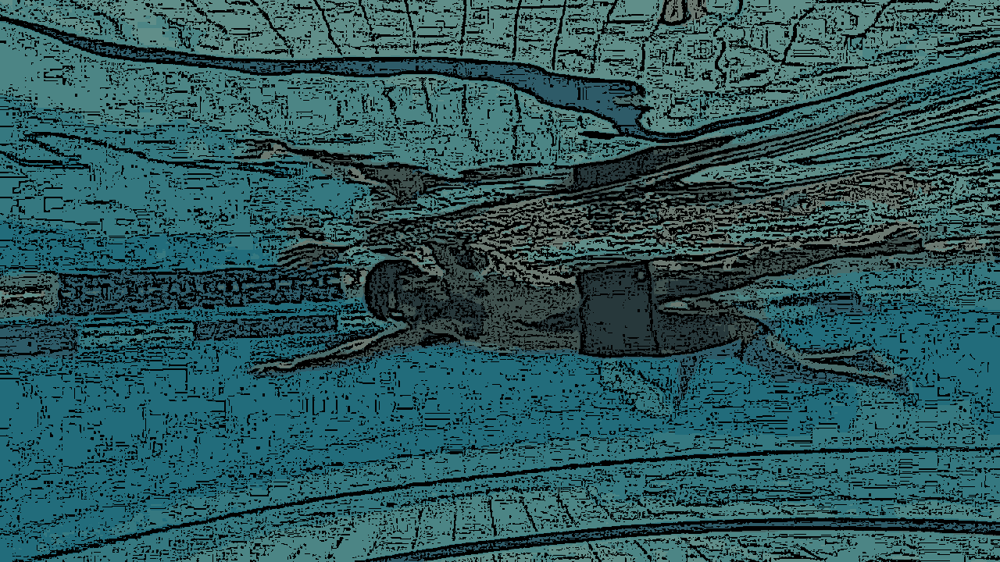

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image15(filename))

# Zip the processed images
zip_filename = "15_blur value(1)+total color(9).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **16. Manipulation with these parameters:**
### blur value = 3
### total color = 7
### combining edge mask with the colored image

In [38]:
folder_path = "C:\\Users\\mayab\\Downloads16"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image16(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 3
    edges = edge_mask(img, line_size, blur_value)

    total_color = 7
    img = color_quantization(img, total_color)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


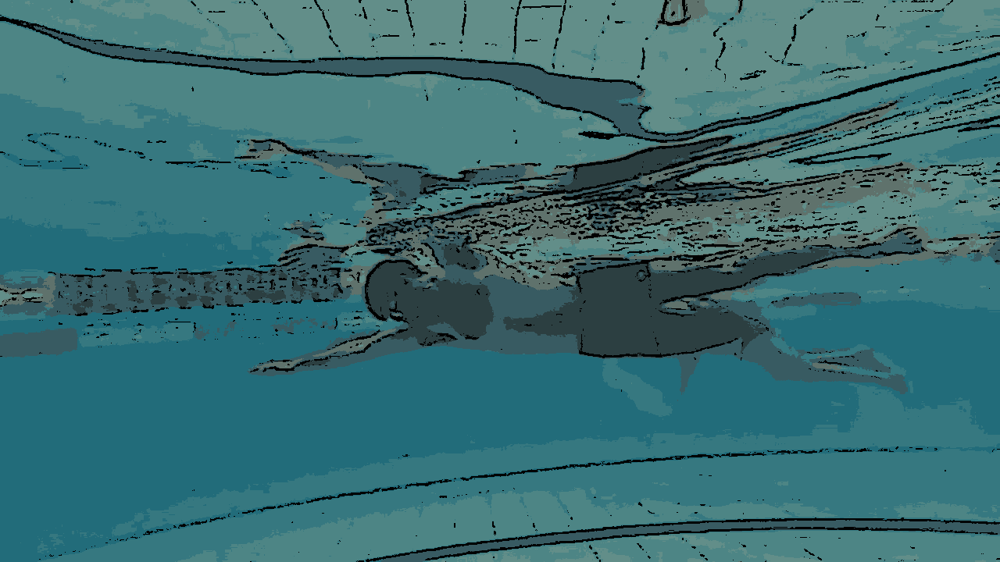

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [39]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image16(filename))

# Zip the processed images
zip_filename = "16_blur value(3)+total color(7).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **17. Manipulation with these parameters:**
### total color = 15
### blur the picture
### combining edge mask with the colored image

In [40]:
folder_path = "C:\\Users\\mayab\\Downloads17"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image17(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    total_color = 15
    img = color_quantization(img, total_color)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)

    # Display the results
    cv2_imshow(blurred)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, blurred)

    return save_path

Processing file: may1004.jpg


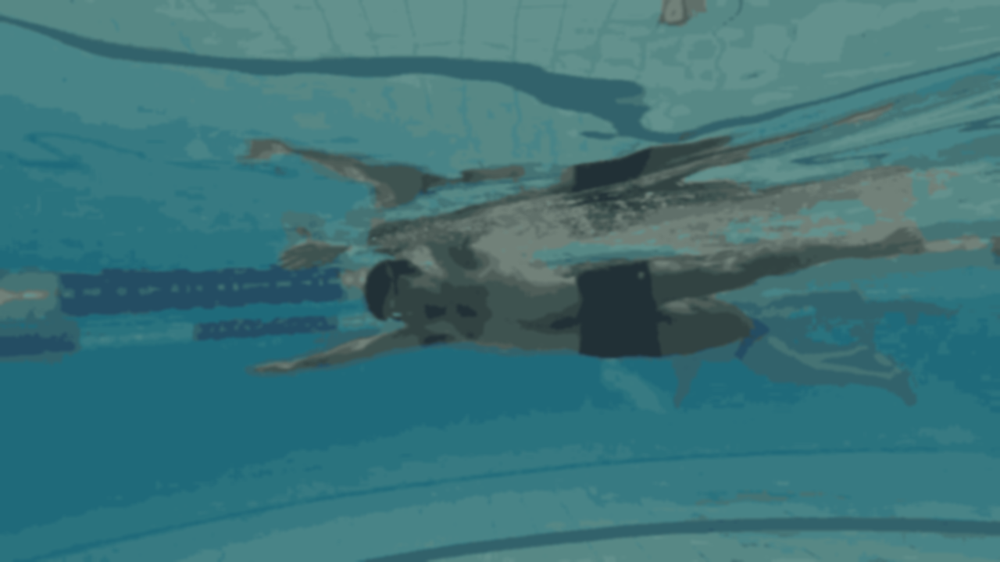

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image17(filename))

# Zip the processed images
zip_filename = "17_total color(15)+blur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **18. Manipulation with these parameters:**
### blur value = 5
### combining edge mask with the colored image

In [42]:
folder_path = "C:\\Users\\mayab\\Downloads18"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image18(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 5
    edges = edge_mask(img, line_size, blur_value)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


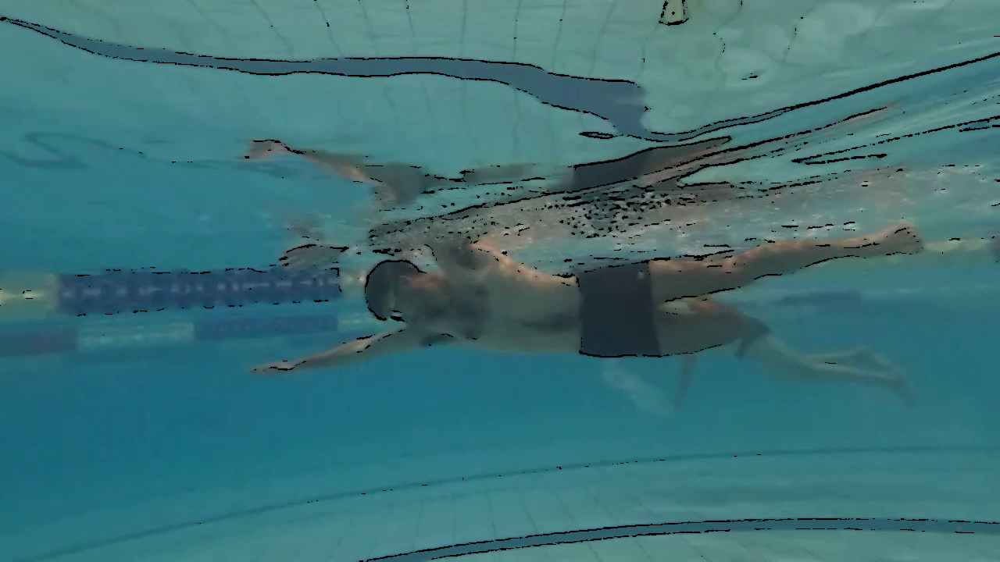

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [43]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image18(filename))

# Zip the processed images
zip_filename = "18_blur value(5) only.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **19. Manipulation with these parameters:**
### blur value = 5
### blur the picture
### combining edge mask with the colored image

In [44]:
folder_path = "C:\\Users\\mayab\\Downloads19"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image19(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)
    line_size = 7
    blur_value = 5
    edges = edge_mask(img, line_size, blur_value)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


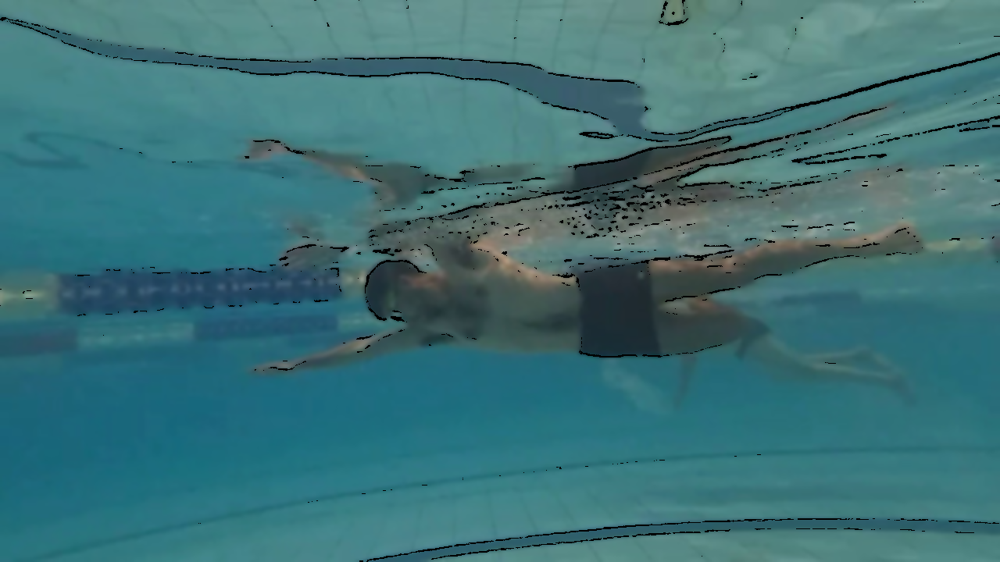

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image19(filename))

# Zip the processed images
zip_filename = "19_blur value(5)+blur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **20. Manipulation with these parameters:**
### total color = 20
### blur the picture
### combining edge mask with the colored image

In [46]:
folder_path = "C:\\Users\\mayab\\Downloads20"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image20(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)
    total_color = 20
    img = color_quantization(img, total_color)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)

    # Display the results
    cv2_imshow(blurred)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, blurred)

    return save_path

Processing file: may1004.jpg


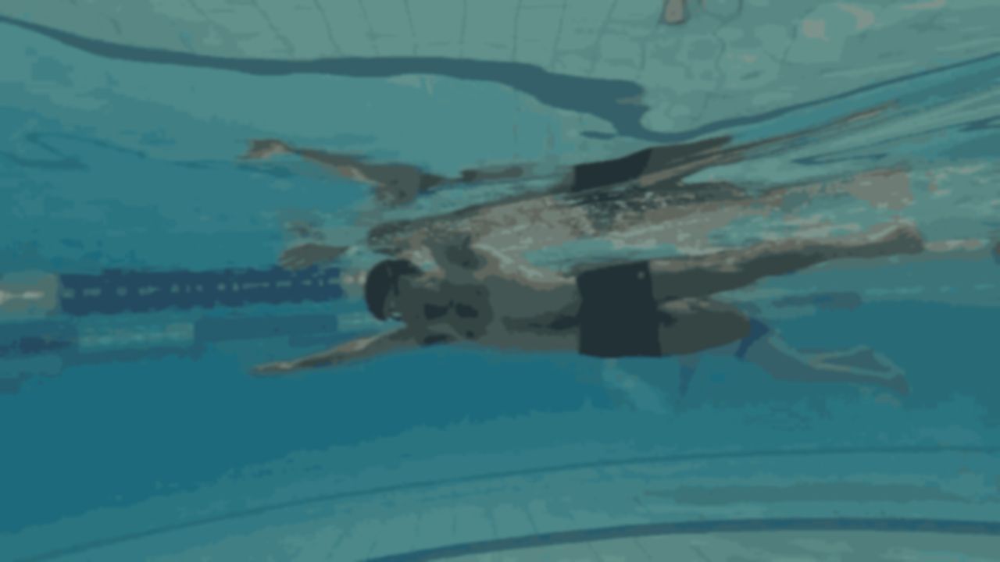

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image20(filename))

# Zip the processed images
zip_filename = "20_total color 20.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **21. Manipulation with these parameters:**
### blur value = 7
### total color = 17
### blur the picture
### combining edge mask with the colored image

In [48]:
folder_path = "C:\\Users\\mayab\\Downloads21"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image21(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    total_color = 17
    img = color_quantization(img, total_color)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


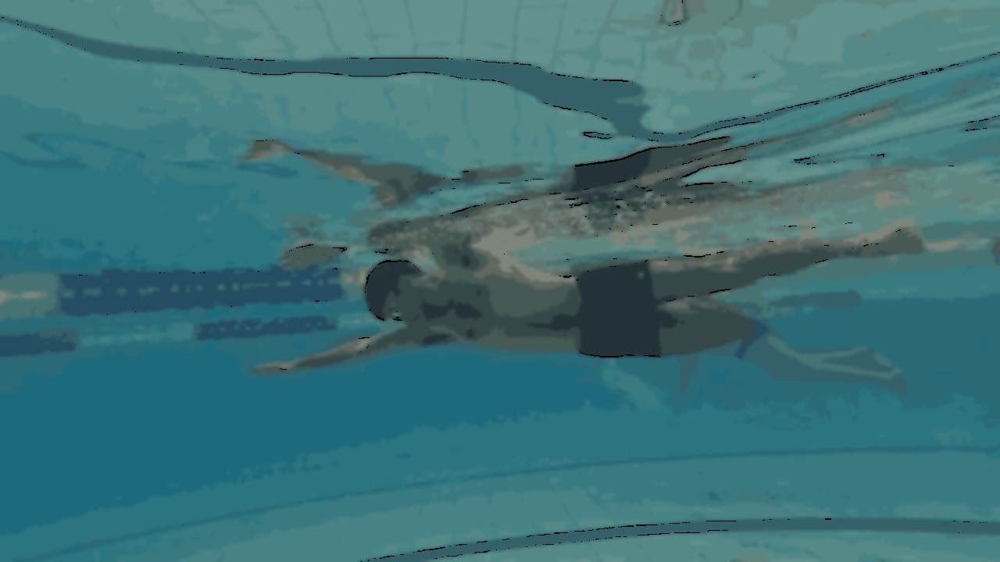

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [49]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image21(filename))

# Zip the processed images
zip_filename = "21_total color 17.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **22. Manipulation with these parameters:**
### total color = 25
### blur the picture
### combining edge mask with the colored image

In [50]:
folder_path = "C:\\Users\\mayab\\Downloads22"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image22(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)
    total_color = 25
    img = color_quantization(img, total_color)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)

    # Display the results
    cv2_imshow(blurred)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, blurred)

    return save_path

Processing file: may1004.jpg


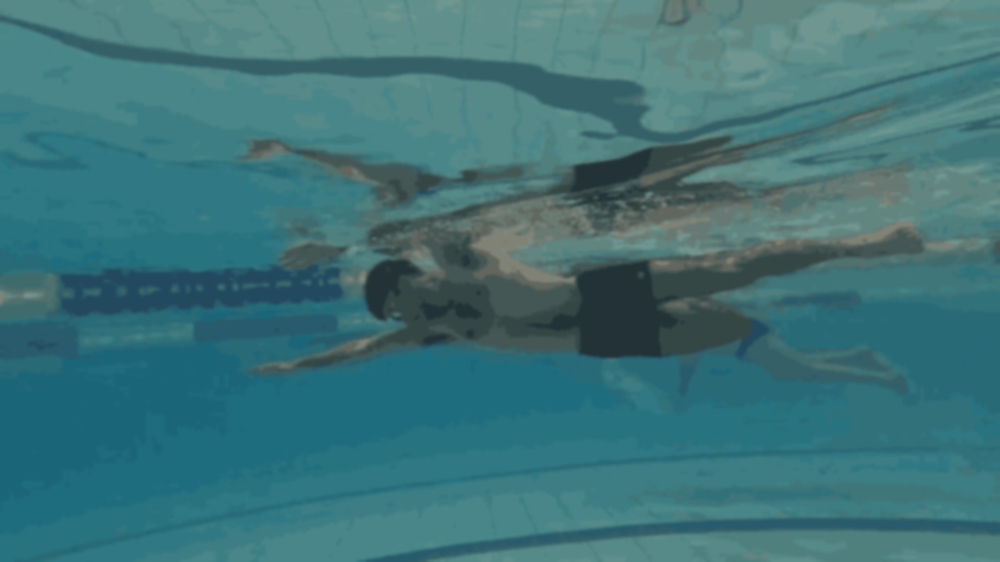

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [51]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image22(filename))

# Zip the processed images
zip_filename = "22_total color 25+blur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# # Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **23. Manipulation with these parameters:**
### blur value = 7
### total color = 25
### blur the picture
### combining edge mask with the colored image

In [52]:
folder_path = "C:\\Users\\mayab\\Downloads23"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image23(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    total_color = 25
    img = color_quantization(img, total_color)
    blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
    cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


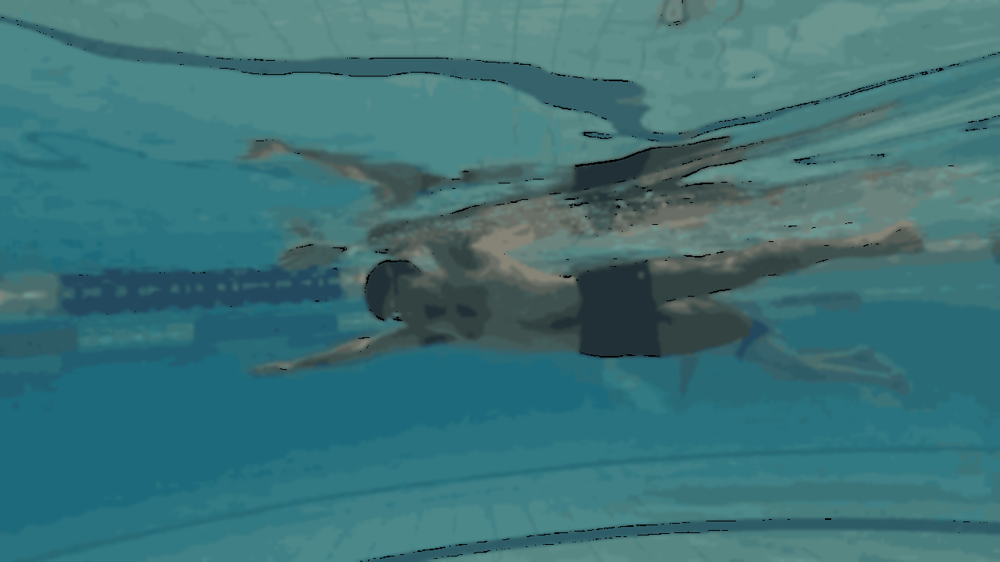

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [53]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image23(filename))

# Zip the processed images
zip_filename = "23_total color(25).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# # Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **24. Manipulation with these parameters:**
### Gaussian blur

In [54]:

folder_path = "C:\\Users\\mayab\\Downloads24"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image24(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    gaussianBlurKernel = np.array(([[1, 2, 1], [2, 4, 2], [1, 2, 1]]), np.float32)/9
    gaussianBlur = cv2.filter2D(src=img, kernel=gaussianBlurKernel, ddepth=-1)

    # Display the results
    cv2_imshow(gaussianBlur)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, gaussianBlur)

    return save_path


Processing file: may1004.jpg


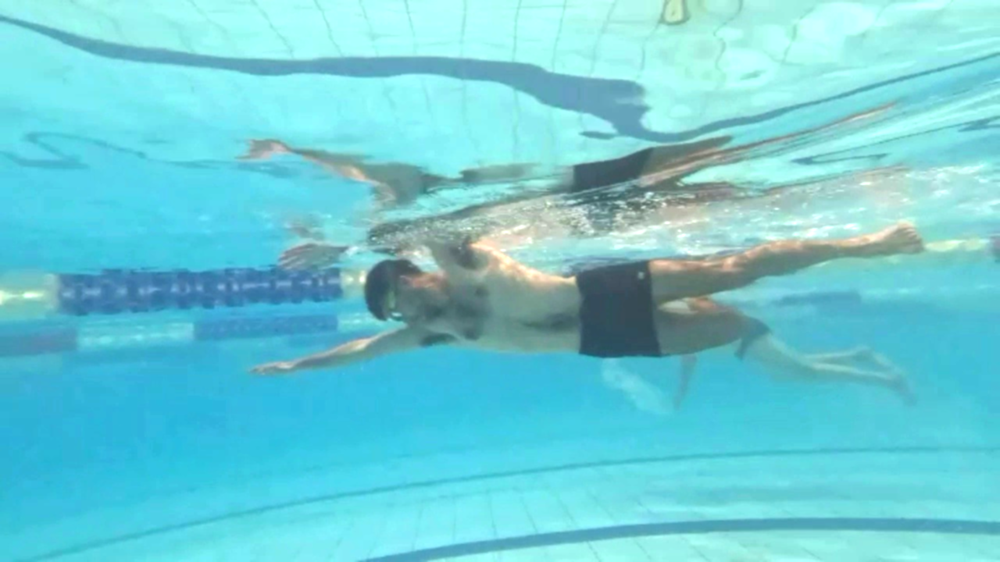

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image24(filename))

# Zip the processed images
zip_filename = "24_gaussianBlur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **25. Manipulation with these parameters:**
### blur value = 7
### Gaussian blur



In [56]:
folder_path = "C:\\Users\\mayab\\Downloads25"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image25(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    gaussianBlurKernel = np.array(([[1, 2, 1], [2, 4, 2], [1, 2, 1]]), np.float32)/9
    gaussianBlur = cv2.filter2D(src=img, kernel=gaussianBlurKernel, ddepth=-1)
    cartoon = cv2.bitwise_and(gaussianBlur, gaussianBlur, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path


Processing file: may1004.jpg


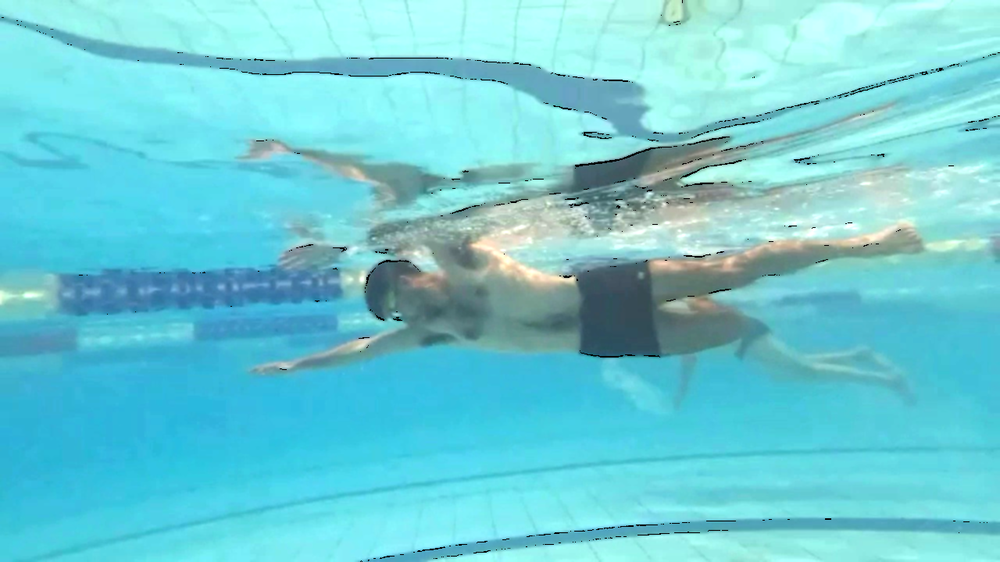

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [57]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image25(filename))

# Zip the processed images
zip_filename = "25_gaussianBlur+edges.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **26. Manipulation with these parameters:**
### sharpen



In [58]:
folder_path = "C:\\Users\\mayab\\Downloads26"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image26(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations

    sharpenKernel = np.array(([[0, -1, 0], [-1, 9, -1], [0, -1, 0]]), np.float32)/9
    sharpen = cv2.filter2D(src=img, kernel=sharpenKernel, ddepth=-1)

    # Display the results
    cv2_imshow(sharpen)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, sharpen)

    return save_path


Processing file: may1004.jpg


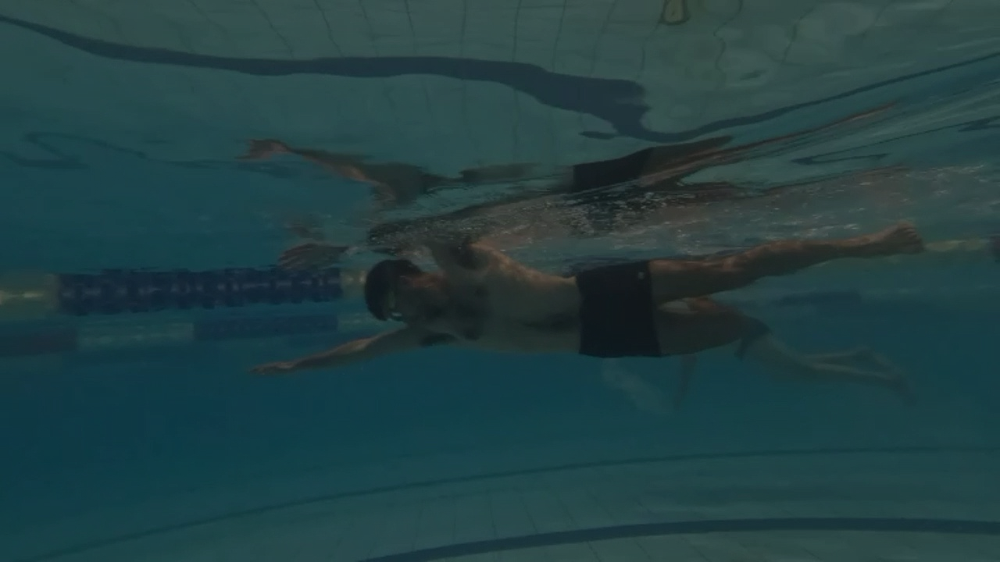

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [59]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image26(filename))

# Zip the processed images
zip_filename = "26_sharpen.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **27. Manipulation with these parameters:**
### mean blur


In [60]:
folder_path = "C:\\Users\\mayab\\Downloads27"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image27(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    meanBlurKernel = np.ones((3, 3), np.float32)/9
    meanBlur = cv2.filter2D(src=img, kernel=meanBlurKernel, ddepth=-1)

    # Display the results
    cv2_imshow(meanBlur)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, meanBlur)

    return save_path


Processing file: may1004.jpg


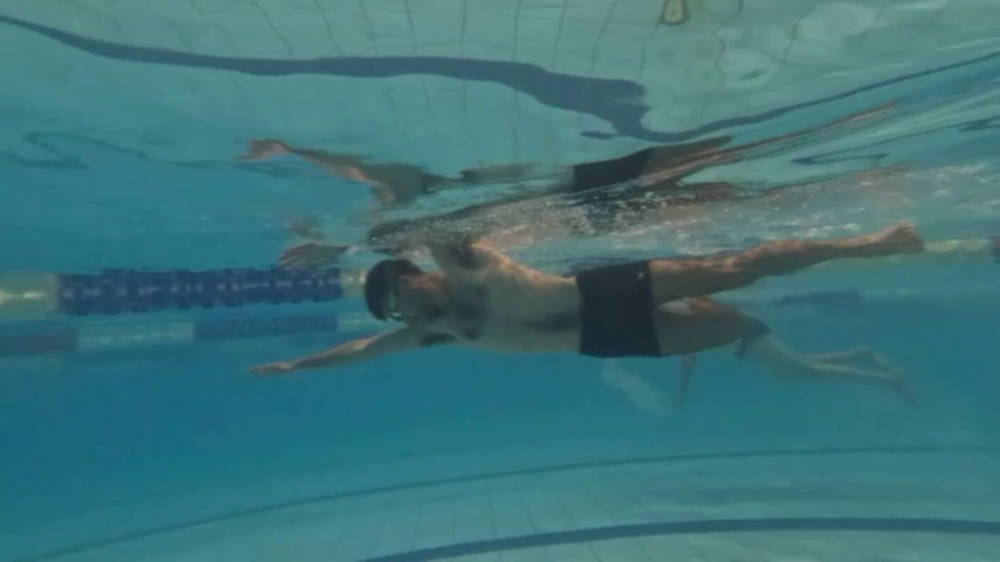

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [61]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image27(filename))

# Zip the processed images
zip_filename = "27_meanBlur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **28. Manipulation with these parameters:**
### mean blur
### blur value = 7

In [62]:
folder_path = "C:\\Users\\mayab\\Downloads28"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image28(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    meanBlurKernel = np.ones((3, 3), np.float32)/9
    meanBlur = cv2.filter2D(src=img, kernel=meanBlurKernel, ddepth=-1)
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    cartoon = cv2.bitwise_and(meanBlur, meanBlur, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


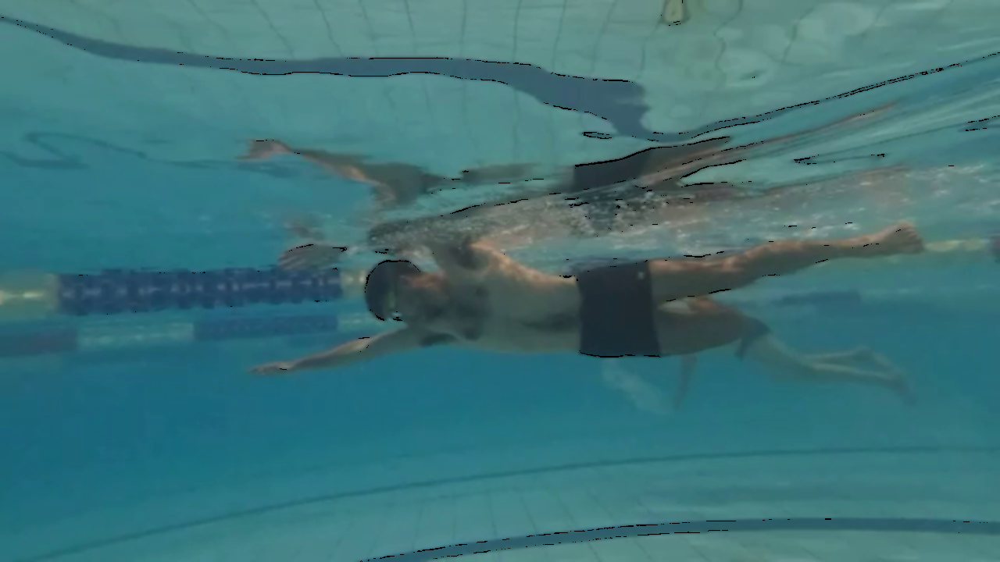

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image28(filename))

# Zip the processed images
zip_filename = "28_meanBlur+edges.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **29. Manipulation with these parameters:**
### sharpen
### blur value = 7

In [64]:
folder_path = "C:\\Users\\mayab\\Downloads29"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image29(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    sharpenKernel = np.array(([[0, -1, 0], [-1, 9, -1], [0, -1, 0]]), np.float32)/9
    sharpen = cv2.filter2D(src=img, kernel=sharpenKernel, ddepth=-1)
    line_size = 7
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    cartoon = cv2.bitwise_and(sharpen, sharpen, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


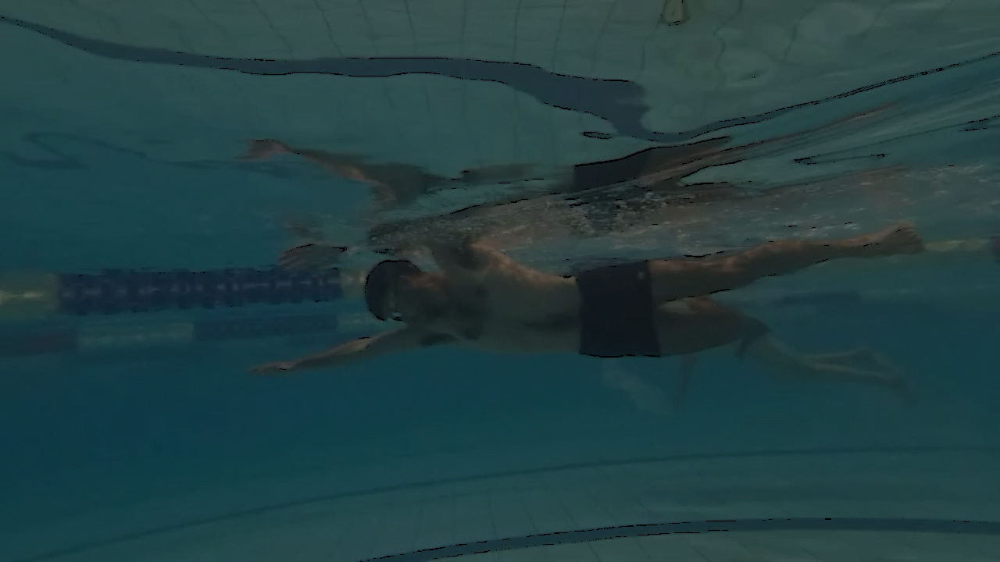

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image29(filename))

# Zip the processed images
zip_filename = "29_sharpen+edges.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **30. Manipulation with these parameters:**
### line size = 5
### blur value = 7

In [66]:
folder_path = "C:\\Users\\mayab\\Downloads30"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image30(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 5
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)

    cartoon = cv2.bitwise_and(img, img, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


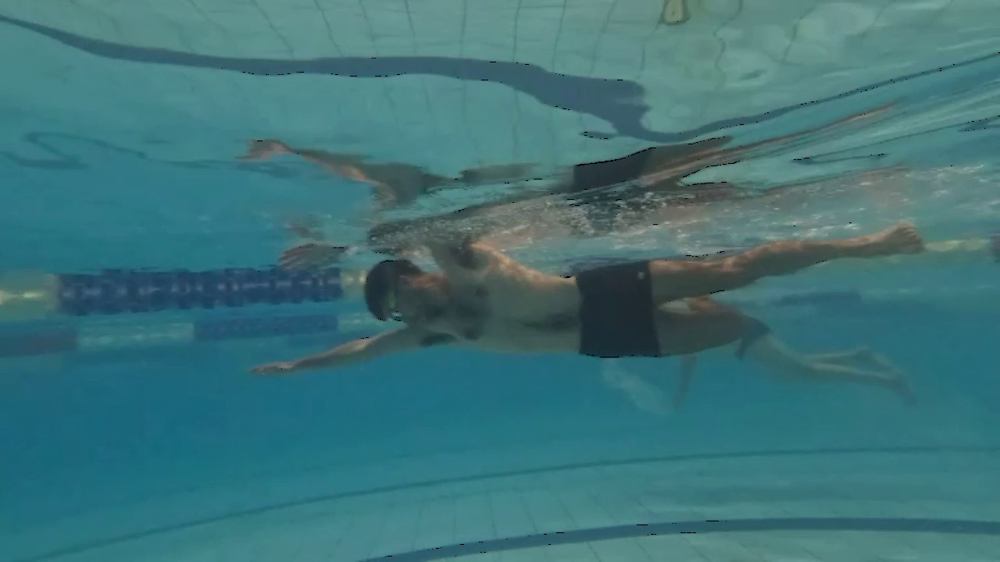

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image30(filename))

# Zip the processed images
zip_filename = "30_blur value(7)+line size(5).zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **31. Manipulation with these parameters:**
### line size = 5
### blur value = 7
### sharpen

In [69]:
folder_path = "C:\\Users\\mayab\\Downloads31"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image31(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 5
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    sharpenKernel = np.array(([[0, -1, 0], [-1, 9, -1], [0, -1, 0]]), np.float32)/9
    sharpen = cv2.filter2D(src=img, kernel=sharpenKernel, ddepth=-1)

    cartoon = cv2.bitwise_and(sharpen, sharpen, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path

Processing file: may1004.jpg


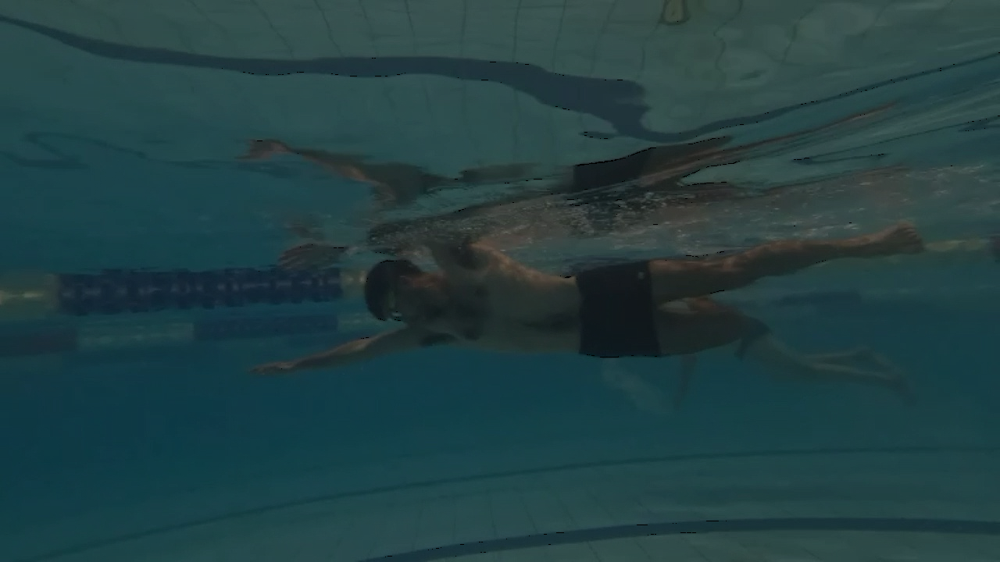

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [70]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image31(filename))

# Zip the processed images
zip_filename = "31_blur value(7)+line size(5)+sharpen.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)

# **32. Manipulation with these parameters:**
### line size = 5
### blur value = 7
### mean blur



In [71]:
folder_path = "C:\\Users\\mayab\\Downloads32"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

def process_image32(filename):
    # Read the image using OpenCV
    img = cv2.imread(filename)

    # Apply image processing operations
    line_size = 5
    blur_value = 7
    edges = edge_mask(img, line_size, blur_value)
    meanBlurKernel = np.ones((3, 3), np.float32)/9
    meanBlur = cv2.filter2D(src=img, kernel=meanBlurKernel, ddepth=-1)

    cartoon = cv2.bitwise_and(meanBlur, meanBlur, mask=edges)

    # Display the results
    cv2_imshow(cartoon)

    save_path = os.path.join(folder_path, f"{os.path.splitext(os.path.basename(filename))[0]}.png")
    cv2.imwrite(save_path, cartoon)

    return save_path


Processing file: may1004.jpg


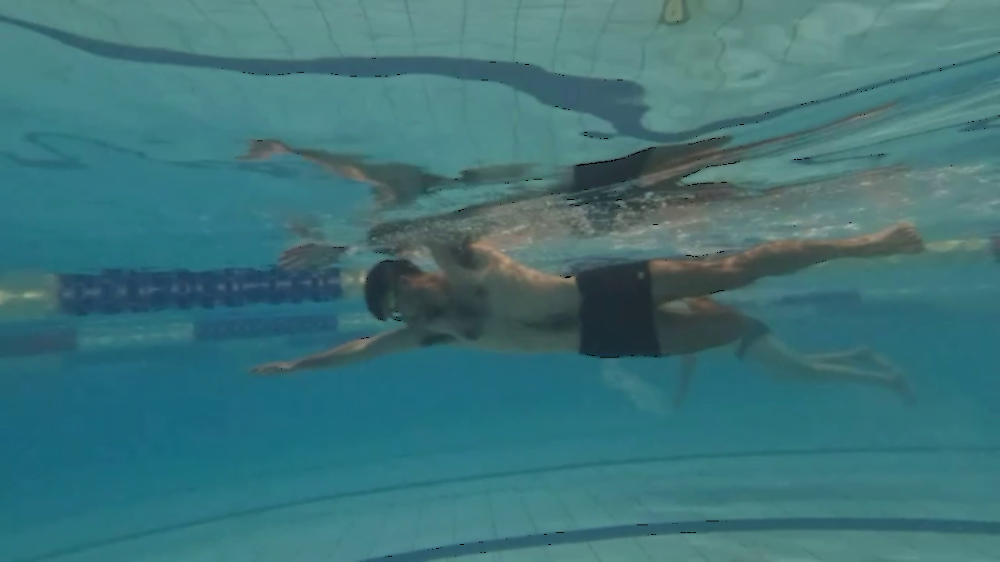

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [72]:
# List to store the paths of processed images
processed_image_paths = []

# Process the uploaded files
for filename, content in uploaded.items():
    print("Processing file:", filename)

    # Save the file locally
    with open(filename, 'wb') as file:
        file.write(content)

    # Process the image and store the path
    processed_image_paths.append(process_image32(filename))

# Zip the processed images
zip_filename = "32_blur value(7)+line size(5)+meanBlur.zip"
with zipfile.ZipFile(zip_filename, "w") as zip_file:
    for image_path in processed_image_paths:
        zip_file.write(image_path, os.path.basename(image_path))

# Download the zip file
time.sleep(2)  # Delay to ensure the zip file is created before downloading
files.download(zip_filename)